# ChatGPT Camera Reasoning Loop

Workflow:
1. Copy `.env.example` to `.env` in the project root and fill in your `OPENAI_API_KEY`.
2. Run **Setup** and **Initialize** cells once.
3. Display the current screenshot and prompt (optional — just for visibility).
4. Run the **Ask ChatGPT** cell — it sends the prompt + screenshot to the OpenAI API and applies the returned action automatically.
5. Repeat step 4 until ChatGPT returns `STOP`.

In [7]:
import sys, os
# Add project root so `camera_reasoning` is importable when running from notebooks/
sys.path.insert(0, os.path.abspath('..'))

from camera_reasoning import CameraReasoningSession
from IPython.display import Image, display

## Initialize Session
Edit the paths and parameters below to match your data.

In [8]:
session = CameraReasoningSession(
    raw_path="../data/foot_256x256x256_uint8.raw",
    dimensions=(256, 256, 256),
    scalar_type="uint8",
    isovalue=80,
    output_dir="../output",
    target_description=(
        "Top view of the foot bones. Big toe on the right, little toe on the left, toes near the bottom, ankle/heel region near the top."
    ),
    target_image_path="../data/target.png",  # optional
    # simple_spatial_knowledge_path="../data/simple_foot_spatial_spec.json",  # optional spatial grounding
)

session.initialize()
session.render_and_save()
session.write_llm_prompt()

Scene initialized. Isovalue=80, dims=(256, 256, 256).


'You are ChatGPT, acting as a camera-reasoning assistant for a 3D VTK scene.\n\nYour job is to compare the current render with the target view and choose exactly\none next camera action.\n\nImportant image-group distinction:\n- reference_items are stable reference views used as visual anchors;\n- candidate_items are one-step action renders generated from the current camera.\nNever interchange these roles.\n\nUse comparative hypothesis reasoning rather than committing to the first plausible\nview interpretation. Evaluate every allowed action before selecting one.\n\nRules:\n- You are NOT allowed to invent raw camera coordinates.\n- You are NOT allowed to output arbitrary angles.\n- You are NOT allowed to generate VTK code.\n- You MUST choose exactly one final action from the allowed action list below.\n- View candidates MUST use exact names from canonical_views.\n- Every allowed action MUST be evaluated exactly once using its exact action name.\n- Do not use confidence as a substitute f

## View Current Screenshot and Prompt

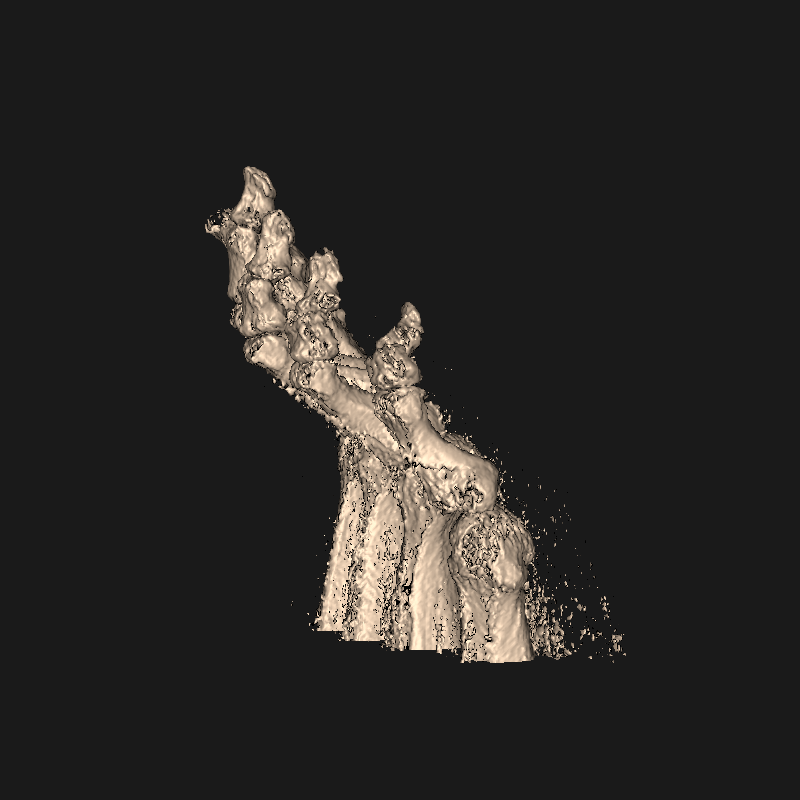

You are ChatGPT, acting as a camera-reasoning assistant for a 3D VTK scene.

Your job is to compare the current render with the target view description and
choose exactly one next camera action.

Use comparative hypothesis reasoning rather than committing to the first plausible
view interpretation. Generate a small set of candidate current views and compare
them against the visible evidence. For camera movement, do NOT shortlist candidates:
you must explicitly evaluate every action in the allowed action list before selecting
the single best next action.

Rules:
- Do not map target words like “top,” “up,” “left,” or “right” directly to camera actions, because target directions may be anatomical or object-relative while camera actions are camera-relative.- You are NOT allowed to invent raw camera coordinates.
- You are NOT allowed to output arbitrary angles.
- You are NOT allowed to generate VTK code.
- You MUST choose exactly one final action from the allowed action list below.
- View c

In [3]:
display(Image("../output/screenshots/latest.png"))
print(open("../output/llm_prompt.txt").read())

## Ask ChatGPT

Two ways to use this:

- **Quick loop** (below): auto-generates the prompt from the current camera state and applies whatever action comes back. Good for just running the loop.
- **Prompt experimentation** (further down): lets you edit the prompt text yourself before sending it, and inspect the reply before deciding whether to apply it. Good for testing prompt/reasoning changes.

In [4]:
# session.ask_chatgpt_and_process()

# display(Image("../output/screenshots/latest.png"))
# print(open("../output/llm_prompt.txt").read())

## Run Multiple Iterations

Runs the quick loop repeatedly instead of re-running the cell above by hand. Stops early if `STOP` comes back.

[image_view_matcher] Loaded 18 cached reference embeddings from ../reference_views_relative/image_embeddings.pkl
[text_view_matcher] Loaded 18 cached reference text embeddings from ../reference_views_relative/text_embeddings.pkl
Injecting 18 reference images+descriptions every iteration: ['view_000', 'view_001', 'view_002', 'view_003', 'view_004', 'view_005', 'view_006', 'view_007', 'view_008', 'view_009', 'view_010', 'view_011', 'view_012', 'view_013', 'view_014', 'view_015', 'view_016', 'view_017']
=== Iteration 1/20 ===
Visual diagnosis:
The current screenshot shows a foot skeleton in what appears to be an oblique anterior/frontal view. Five elongated metatarsal shaft bones are clearly visible running roughly vertically through the center of the frame. Above these (in the upper portion), there is a complex cluster of irregular tarsal bones with textured surfaces. The toes (phalanges) are visible extending from the tops of the metatarsals, with some segmentation apparent. The overall

/Users/chulu/Documents/llm-vis/.venv/lib/python3.9/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


[image_view_matcher] Loading 'openai/clip-vit-base-patch32' on cpu...


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


[text_view_matcher] Loading 'openai/clip-vit-base-patch32' on cpu...
Top-3 similar image views (BEFORE this iteration's camera action):
    1. view_003             similarity=1.0000
    2. view_004             similarity=0.9355
    3. view_013             similarity=0.9334
Top-3 similar description views:
    1. view_011             similarity=0.8435
    2. view_007             similarity=0.8351
    3. view_004             similarity=0.8309
Extracted action: ELEVATION_DOWN_COARSE
Step 1: ELEVATION_DOWN_COARSE applied.


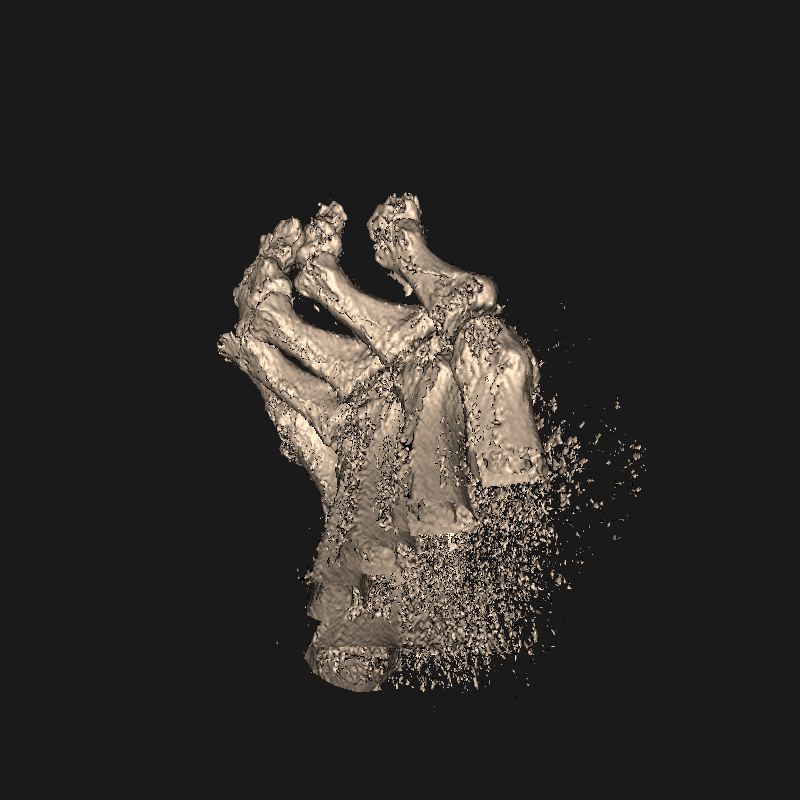

=== Iteration 2/20 ===


KeyboardInterrupt: 

In [ ]:
import json
from camera_reasoning.spatial_knowledge import extract_diagnosis_sections
from camera_reasoning.image_view_matcher import ImageViewMatcher
from camera_reasoning.text_view_matcher import TextViewMatcher
from camera_reasoning.frozen_reference_alignment import verify_observation_against_embeddings

# Built once, reused every iteration below — only the query (current screenshot /
# current observation text) gets re-encoded per iteration, not the reference database.
# Cache paths are scoped under reference_views_relative/ (not the shared top-level
# reference_embeddings.pkl / reference_text_embeddings.pkl) so switching back to
# ../reference_views later can't silently load a stale cache built from this bank.
image_matcher = ImageViewMatcher(reference_dir="../reference_views_relative", cache_path="../reference_views_relative/image_embeddings.pkl")
image_matcher.build_index()
text_matcher = TextViewMatcher(descriptions_path="../reference_views_relative/view_descriptions.json", cache_path="../reference_views_relative/text_embeddings.pkl")
text_matcher.build_index()

# reference_items: injected into every ask_chatgpt() call below so the model sees
# each reference image immediately followed by its own description (image,
# description, image, description, ...) rather than images and text separately.
# Built once here (the graph bank doesn't change mid-loop), reused every iteration.
_nodes = json.loads(open("../reference_views_relative/camera_nodes.json").read())
_descriptions = {d["node_id"]: d["description"] for d in json.loads(open("../reference_views_relative/view_descriptions.json").read())}
reference_items = [
    (n["node_id"], "../" + n["image_path"], _descriptions[n["node_id"]])
    for n in _nodes
    if n["node_id"] in _descriptions
]
print(f"Injecting {len(reference_items)} reference images+descriptions every iteration: {[label for label, _, _ in reference_items]}")

num_iterations = 20

for i in range(num_iterations):
    print(f"=== Iteration {i + 1}/{num_iterations} ===", flush=True)

    # Capture the screenshot path BEFORE applying any action this iteration —
    # process_chatgpt_response() below re-renders and overwrites latest.png, so
    # verification must run first, against the exact same image the model saw
    # (and described in its "Visual observation"), not the post-rotation result.
    current_image_path = "../output/screenshots/latest.png"

    response = session.ask_chatgpt(reference_items=reference_items)
    print(response, flush=True)

    # observation_text = extract_diagnosis_sections(response).get("visual_observation")
    # if observation_text:
    #     verification = verify_observation_against_embeddings(
    #         current_image_path, observation_text, image_matcher, text_matcher, top_k=5
    #     )
    #     print("Top-3 similar image views (BEFORE this iteration's camera action):", flush=True)
    #     for m in verification["image_top_k"][:3]:
    #         print(f"    {m['rank']}. {m['view_label']:<20s} similarity={m['similarity']:.4f}", flush=True)
    #     print("Top-3 similar description views:", flush=True)
    #     for m in verification["text_top_k"][:3]:
    #         print(f"    {m['rank']}. {m['view_label']:<20s} similarity={m['similarity']:.4f}", flush=True)
    # else:
    #     print("No 'Visual observation' section found in response; skipping verification.", flush=True)

    # NOW apply the action — this re-renders and overwrites latest.png with the new view.
    action = session.process_chatgpt_response(response)

    display(Image("../output/screenshots/latest.png"))
    if action == "STOP":
        break

## Experiment with a Custom Prompt

1. Start from the auto-generated prompt (or write your own from scratch).
2. Edit `custom_prompt` however you like — reword the rules, add few-shot examples, change the target description, etc.
3. Run the next cell to send it and see the raw reply, without applying anything yet.
4. If you're happy with the result, run the final cell to apply the returned action.

In [ ]:
# Start from the auto-generated prompt, then edit freely.
custom_prompt = session.write_llm_prompt()
print(custom_prompt)

In [ ]:
# Edit custom_prompt above (or reassign it directly here), then send it without applying the result.
response = session.ask_chatgpt(prompt=custom_prompt)
print(response)

In [ ]:
# Happy with the response? Apply it.
session.process_chatgpt_response(response)

display(Image("../output/screenshots/latest.png"))

## Frozen-Reference-Embedding Alignment (Experimental)

An alternative to the text-based loop above. Instead of reasoning from scratch every
iteration, it:
1. Picks the single most visually similar reference view **once**, via image
   embeddings (`reference_views/`), and freezes it as the alignment target.
2. Every iteration: the LLM describes the current screenshot and compares it against
   that same frozen target (never re-picks a new target), then chooses a camera action.
3. Also cross-checks the LLM's own description against the reference database via
   both image embeddings and text embeddings — printing the top-3 matches (with
   scores) from each, every iteration, so you can spot when the LLM's words disagree
   with what the embeddings say.

Requires `reference_views/` + `reference_views/view_descriptions.json` to already
exist (see `examples/generate_reference_views.py` and
`camera_reasoning/view_description_generator.py` if you haven't generated them yet).

In [ ]:
from camera_reasoning.frozen_reference_alignment import run_camera_reasoning_pipeline

result = run_camera_reasoning_pipeline(
    session,
    num_iterations=5,
    use_frozen_reference_alignment=True,
    references_dir="../reference_views",
    dry_run=False,  # set True to freeze the target + analyze/reason once WITHOUT moving the camera
)

display(Image("../output/screenshots/latest.png"))
print("\nFrozen target view:", result["alignment_target_reference"]["view_name"])
print("Applied actions:", result["applied_actions"])

## Visual-Rollout Camera-Action Selection (Experimental)

A different alternative to the text-based loop above. Instead of picking a camera
action from action *names* + a single current screenshot, every iteration:
1. Renders one candidate image per available camera action, each starting from the
   exact current camera state (never cumulative with each other, and the active
   camera is restored after every candidate — see `render_candidate_rollouts()`).
2. Sends the current image, the target description/image, and every candidate
   image immediately followed by its own action description to the LLM.
3. Asks the LLM to select the action whose *rendered outcome* is closest to the
   target — explicitly judged from the rendered pixels, not from keywords in the
   action names — then applies only that one selected action.

The reasoning schema mirrors the exhaustive per-action evaluation from the
text-based loop above (`current_visual_observation`, `target_difference`, and a
per-candidate `observed_visual_change` / `relation_to_target` / `history_check` /
`verdict` / `justification`) — merged so both loops reason the same way, but this
one grounds every candidate in an actual rendered image instead of an imagined one.

`ACTION_SUBSET = None` evaluates every action in `VALID_ACTIONS` each iteration
(~22 candidates + STOP), which is a much larger/slower/costlier API call per
iteration than the loops above. Set it to a smaller set (as below) to try this out
more cheaply first.

Every iteration's candidates, full evaluation, and applied action are logged to
`../output/rollout_traces/rollout_NNN.json` for debugging.

In [ ]:
import json
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from camera_reasoning.visual_rollout_agent import run_visual_rollout_alignment_loop

def display_rollout_candidates(trace_path: str):
    """Show every candidate rollout image from one iteration's trace, labeled with
    its action name + verdict, with the selected candidate marked. Passed as
    on_iteration_end below, so this pops up live after each iteration finishes —
    not only once the whole loop is done."""
    trace = json.loads(open(trace_path).read())
    candidates = trace["candidates"]
    selection = trace["selection"]
    verdicts = {c["action"]: c.get("verdict") for c in selection.get("candidate_evaluation", [])}
    selected_action = selection.get("selected_action")

    n = len(candidates)
    cols = min(n, 6)
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
    axes = axes.flatten() if n > 1 else [axes]

    for i, c in enumerate(candidates):
        img = mpimg.imread(c["image_path"])
        axes[i].imshow(img)
        axes[i].axis("off")
        marker = "\n★ SELECTED" if c["action"] == selected_action else ""
        axes[i].set_title(f"{c['action']}\n{verdicts.get(c['action'], '')}{marker}", fontsize=9)
    for j in range(n, len(axes)):
        axes[j].axis("off")

    fig.suptitle(f"Iteration {trace['iteration']} — candidate rollouts")
    plt.tight_layout()
    plt.show()

# Start small/cheap. Set to None to evaluate every action in VALID_ACTIONS instead.
ACTION_SUBSET = {
    "AZIMUTH_LEFT_COARSE", "AZIMUTH_RIGHT_COARSE",
    "ELEVATION_UP_COARSE", "ELEVATION_DOWN_COARSE",
    "ZOOM_IN", "ZOOM_OUT", "STOP",
}

rollout_result = run_visual_rollout_alignment_loop(
    session,
    max_iterations=10,
    action_subset=ACTION_SUBSET,
    on_iteration_end=display_rollout_candidates,
)

display(Image("../output/screenshots/latest.png"))
print("\nApplied actions:", rollout_result["applied_actions"])

In [ ]:
# Post-hoc replay: re-display every iteration's candidates from the last run,
# in case you want to scroll back through the whole run again without re-running it.
import glob

trace_files = sorted(glob.glob("../output/rollout_traces/rollout_*.json"))
print(f"Found {len(trace_files)} rollout trace(s) from the last run.")
for trace_path in trace_files:
    display_rollout_candidates(trace_path)

## Old Agent + Rendered Candidate Images

Same reasoning/prompt as **Run Multiple Iterations** above — `prompt_writer.py` and
`session.py` are completely unmodified, still producing the exact same free-form
"Visual diagnosis" → exhaustive action-by-action evaluation (`effect` /
`relation_to_target` / `predicted_visual_change` / `history_check` / `verdict` /
`justification`) → "Next action" format.

The only addition: before each `ask_chatgpt()` call, every candidate action is
actually rendered first (reusing `render_candidate_rollouts()`, unmodified, from
the visual-rollout section above) and attached via `reference_items`, so the model
sees real candidate renders alongside its usual text prompt — instead of only
ever seeing the single current screenshot and imagining `predicted_visual_change`.

`ACTION_SUBSET = None` renders every action in `VALID_ACTIONS` each iteration; set
a smaller set (as below) to try this out more cheaply first.

Loaded 18 graph-bank reference items: ['view_000', 'view_001', 'view_002', 'view_003', 'view_004', 'view_005', 'view_006', 'view_007', 'view_008', 'view_009', 'view_010', 'view_011', 'view_012', 'view_013', 'view_014', 'view_015', 'view_016', 'view_017']
=== Iteration 1/10 ===
Rendered 7 candidate images: ['AZIMUTH_LEFT_COARSE', 'AZIMUTH_RIGHT_COARSE', 'ELEVATION_DOWN_COARSE', 'ELEVATION_UP_COARSE', 'STOP', 'ZOOM_IN', 'ZOOM_OUT']
Visual observation:
The current render shows a foot bone structure viewed from an oblique angle. The foot is oriented diagonally across the frame, extending from the lower right toward the upper left. The toes (phalanges) are visible in the upper left portion of the image, appearing as small, segmented bones. The metatarsals (long bones forming the midfoot) extend through the center of the frame as elongated cylindrical structures. The tarsal bones (ankle/heel region) form a broader, wedge-shaped cluster in the lower right portion of the frame. The overall vie

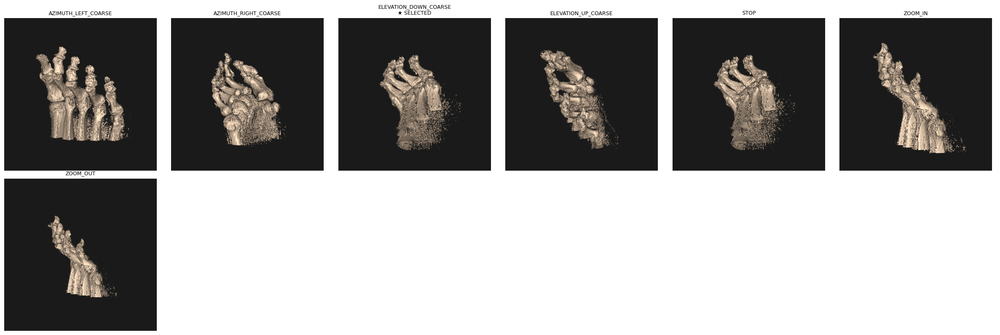

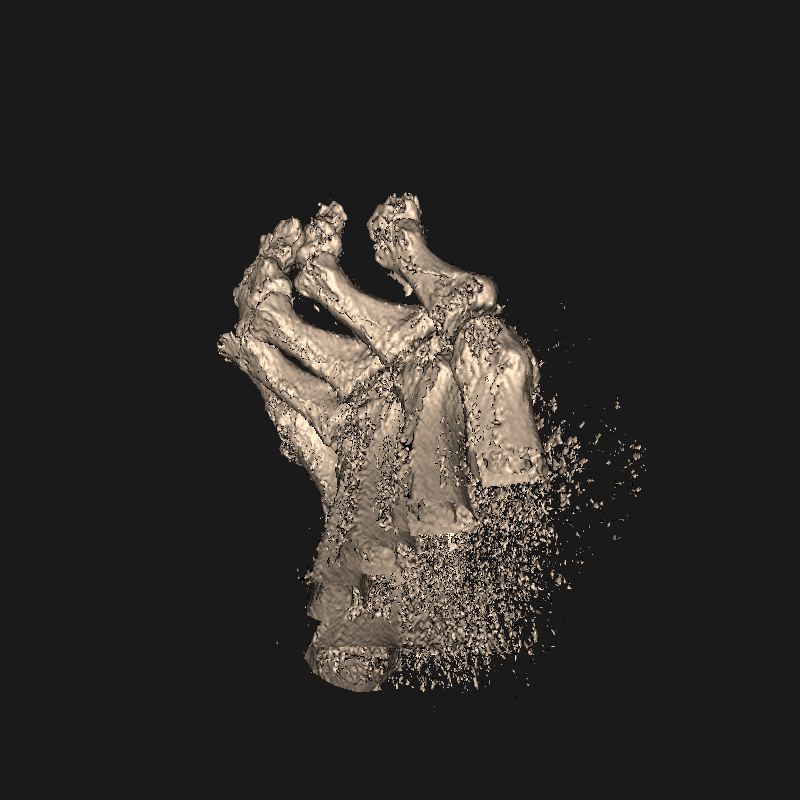

=== Iteration 2/10 ===
Rendered 7 candidate images: ['AZIMUTH_LEFT_COARSE', 'AZIMUTH_RIGHT_COARSE', 'ELEVATION_DOWN_COARSE', 'ELEVATION_UP_COARSE', 'STOP', 'ZOOM_IN', 'ZOOM_OUT']
Visual observation:
The current render shows a foot skeleton viewed from an oblique angle. The foot is oriented with the toes pointing toward the upper-left of the frame and the heel/ankle region toward the lower-right. Five distinct toe rays are visible with their phalangeal bones, and the metatarsal shafts are clearly visible running through the center of the image. The tarsal/heel region appears as a denser cluster of bones in the lower-right portion. The view shows significant three-dimensional depth with bones overlapping and some structures appearing in the foreground while others recede. There is visible fragmentation or particle-like rendering particularly around the heel region on the right side. The overall orientation shows the dorsal (top) surface of the foot facing somewhat toward the viewer, but 

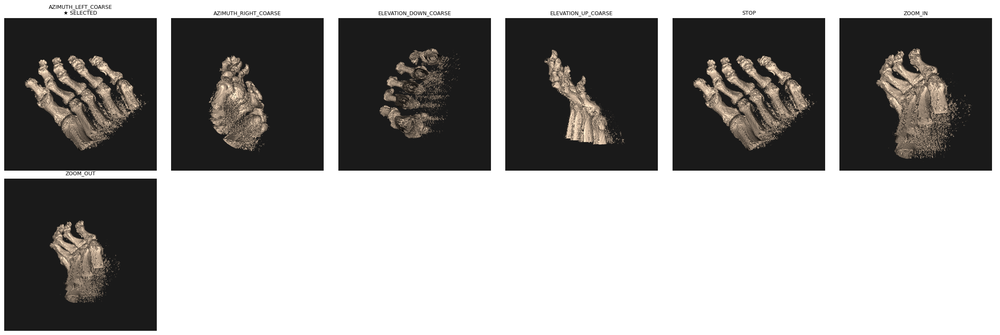

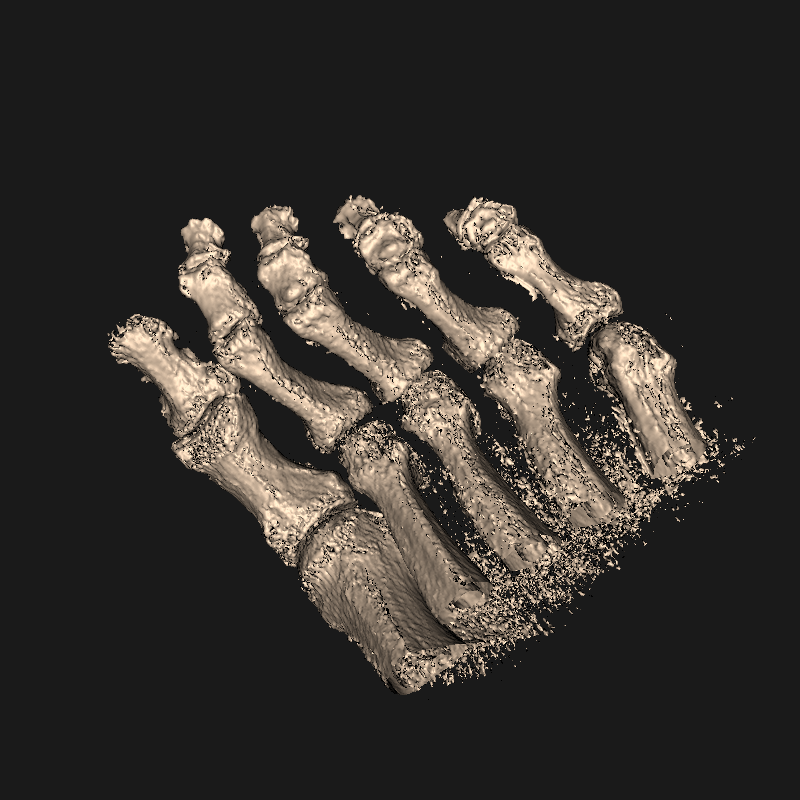

=== Iteration 3/10 ===
Rendered 7 candidate images: ['AZIMUTH_LEFT_COARSE', 'AZIMUTH_RIGHT_COARSE', 'ELEVATION_DOWN_COARSE', 'ELEVATION_UP_COARSE', 'STOP', 'ZOOM_IN', 'ZOOM_OUT']
Visual observation:
The current render displays a complete foot skeleton from an oblique superior-anterior viewpoint. Five metatarsal bones are clearly visible as elongated cylindrical shafts arranged roughly parallel across the center and lower portions of the frame. Their proximal (base) ends converge in the lower-left area where clustered tarsal bones show complex, irregular surfaces. The distal ends of the metatarsals extend toward the upper-right, where phalanges (toe bones) articulate in segmented rows. The big toe (hallux) appears on the right side with robust metatarsal and phalanges, while progressively smaller toes extend leftward. The overall foot structure is oriented diagonally, rising from lower-left to upper-right. Surface texture is detailed throughout, showing trabecular bone architecture and 

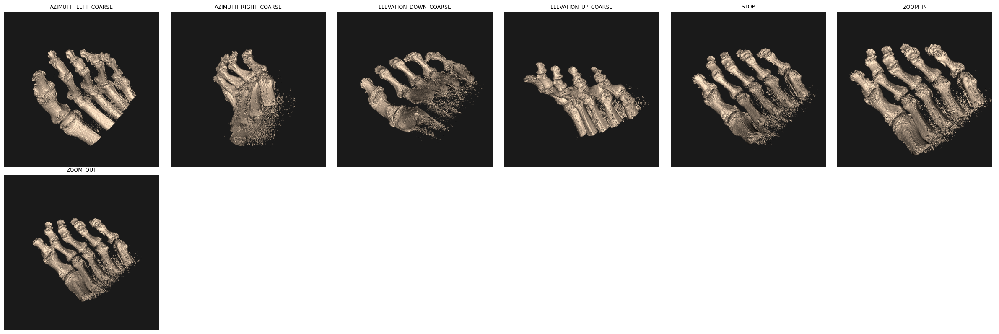

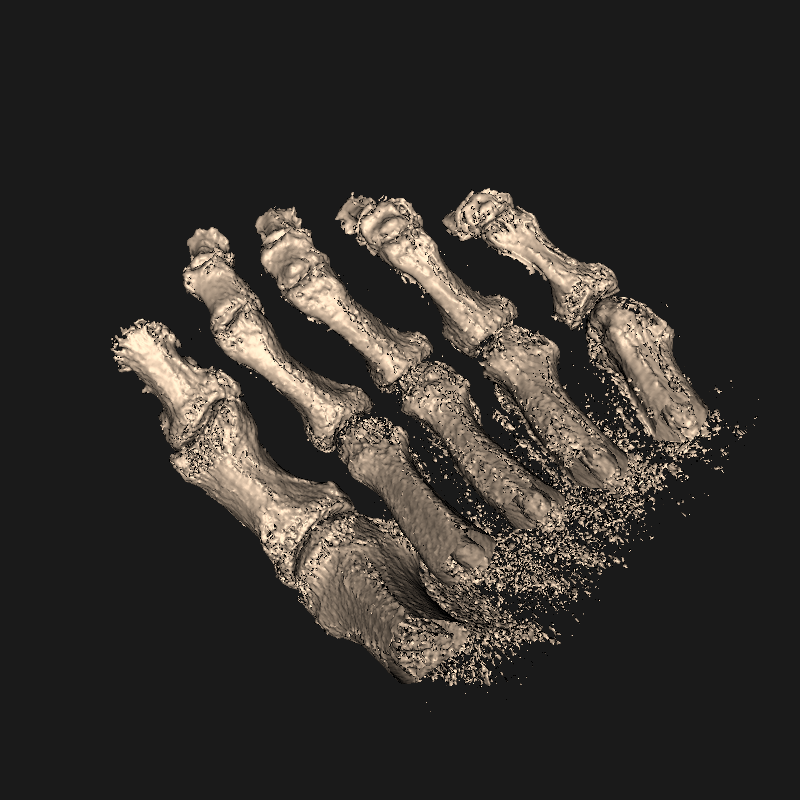

=== Iteration 4/10 ===
Rendered 7 candidate images: ['AZIMUTH_LEFT_COARSE', 'AZIMUTH_RIGHT_COARSE', 'ELEVATION_DOWN_COARSE', 'ELEVATION_UP_COARSE', 'STOP', 'ZOOM_IN', 'ZOOM_OUT']
Visual observation:
The current render shows a foot skeleton viewed from an oblique angle. Five distinct toe rays are visible, each consisting of multiple phalangeal segments. The toes extend diagonally from lower-left toward upper-right across the frame. The leftmost toe (big toe) appears largest and longest, while the toes progressively decrease in size toward the right (little toe). In the lower-left portion, there's a large cluster of tarsal bones with irregular, blocky shapes showing complex surface textures. The elongated metatarsal shafts bridge the space between the tarsal cluster and the toe phalanges. The overall view shows the dorsal (top) surface of the foot but at a significant oblique angle rather than a pure top-down view. Scattered particle artifacts are visible, particularly around the tarsal 

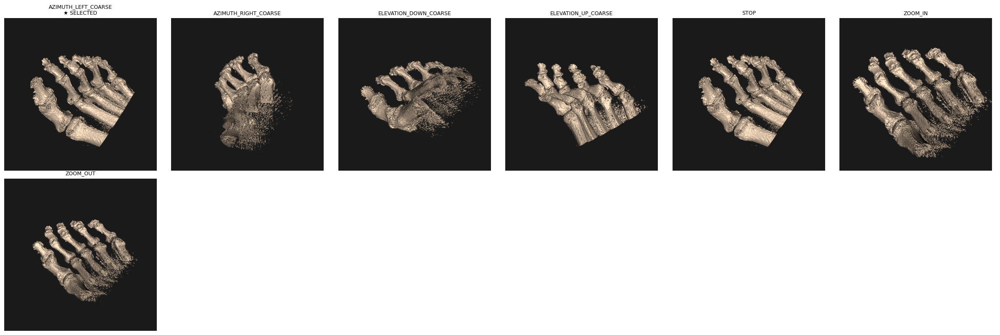

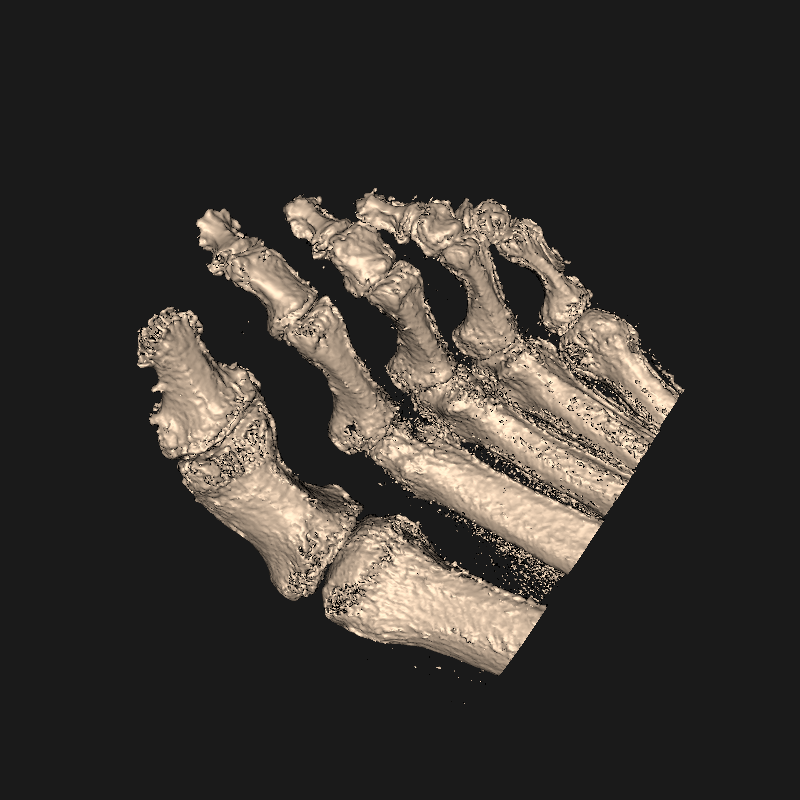

=== Iteration 5/10 ===
Rendered 7 candidate images: ['AZIMUTH_LEFT_COARSE', 'AZIMUTH_RIGHT_COARSE', 'ELEVATION_DOWN_COARSE', 'ELEVATION_UP_COARSE', 'STOP', 'ZOOM_IN', 'ZOOM_OUT']
Visual observation:
The current render shows a foot bone structure viewed from an oblique angle. Five distinct metatarsals and toe rays are visible, arranged with the big toe (first ray) prominently positioned on the left side of the frame and progressively smaller toes extending toward the right. The elongated metatarsal shafts are clearly visible in the lower and central portions of the frame, running roughly vertically. At the top of the frame, the toe bones (phalanges) are visible with their articulated segments. At the bottom/lower portion of the frame, there is a cluster of tarsal bones showing irregular, blocky shapes representing the heel and ankle region. The overall view shows the foot from a perspective that emphasizes the length of the metatarsals and creates a fan-like spreading pattern from the t

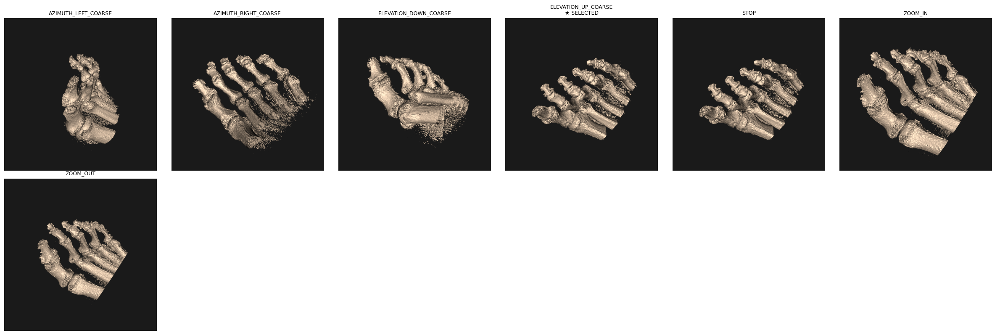

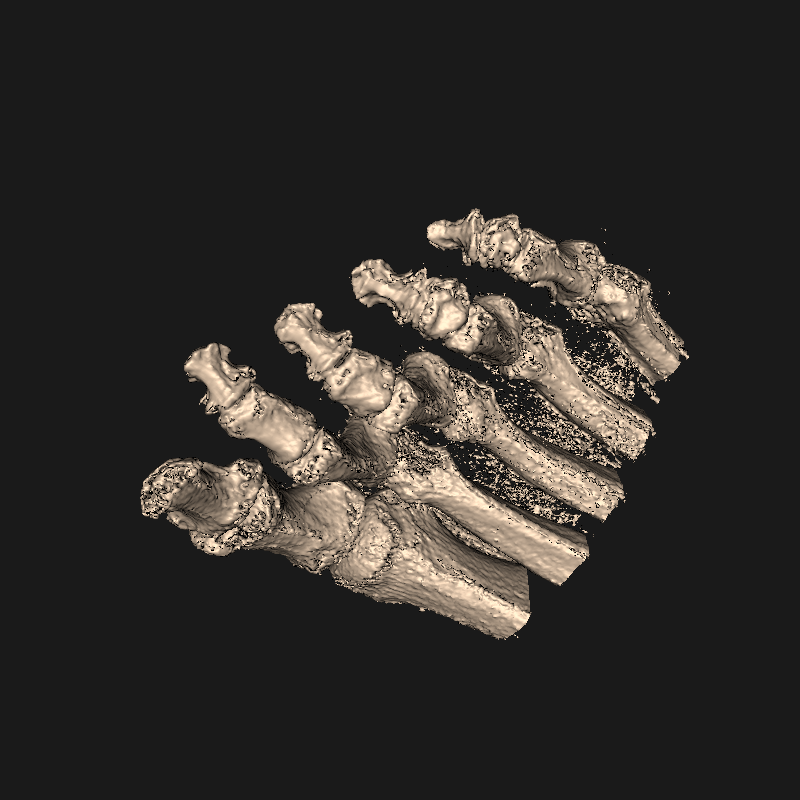

=== Iteration 6/10 ===
Rendered 7 candidate images: ['AZIMUTH_LEFT_COARSE', 'AZIMUTH_RIGHT_COARSE', 'ELEVATION_DOWN_COARSE', 'ELEVATION_UP_COARSE', 'STOP', 'ZOOM_IN', 'ZOOM_OUT']
Visual observation:
The current render shows a foot skeleton viewed from an oblique angle. Five distinct toe rays are visible, arranged with elongated metatarsal shaft bones extending diagonally across the frame. The toes (phalanges) appear in the upper portion of the frame, while a cluster of tarsal bones is visible in the lower-left area. The overall orientation shows the foot structure extending from lower-left to upper-right. The bones display detailed surface texture with visible articulation points and some rendering artifacts appearing as scattered particles, particularly around the tarsal region.

Reference-view grounding:

reference_label: view_000
  diagnostic_visual_features: Five toe rays in fan-like configuration, elongated bones extending upward and diverging, leftmost ray longest, toes at top, t

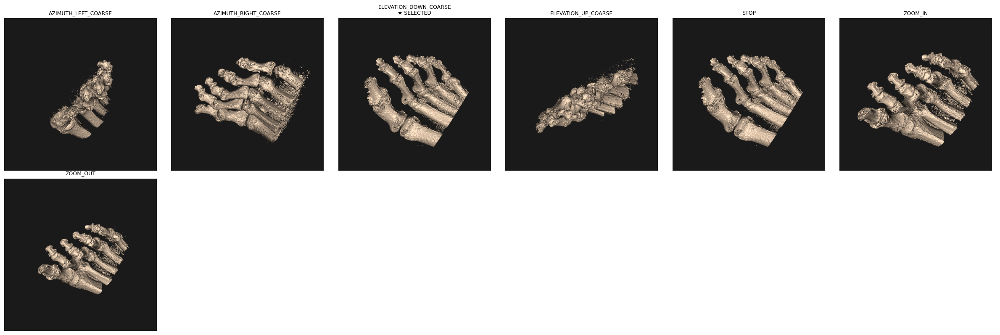

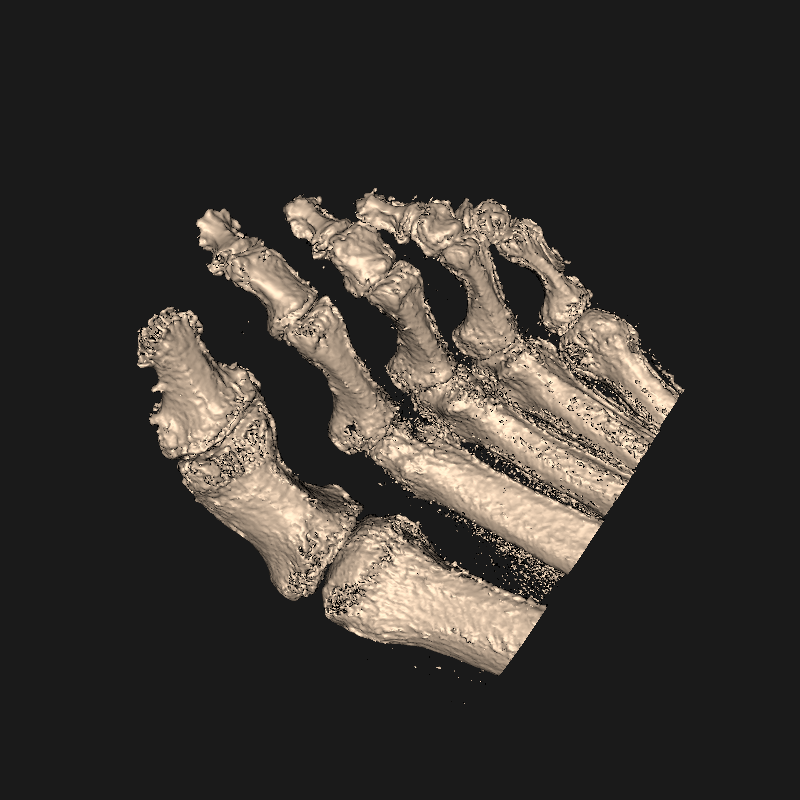

=== Iteration 7/10 ===
Rendered 7 candidate images: ['AZIMUTH_LEFT_COARSE', 'AZIMUTH_RIGHT_COARSE', 'ELEVATION_DOWN_COARSE', 'ELEVATION_UP_COARSE', 'STOP', 'ZOOM_IN', 'ZOOM_OUT']
Visual observation:
The current render displays foot bones in an oblique three-dimensional view. Five elongated metatarsal shaft bones are visible in the central and lower portion of the frame, arranged roughly parallel to each other and extending diagonally across the image from lower left to upper right. The toe bones (phalanges) are visible at the upper portion, showing segmented articulations. On the left side, there is a clustered collection of irregular, rounded tarsal bones forming the hindfoot region. The overall orientation shows the structure angled in space with the metatarsals prominent in the center. The view appears to be from an elevated, oblique lateral perspective.

Reference-view grounding:

reference_label: view_000
  diagnostic_visual_features: Five digit rays fanning upward and outward fro

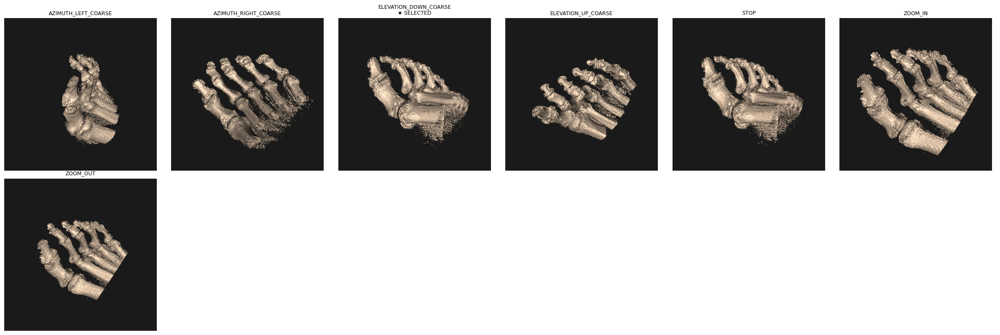

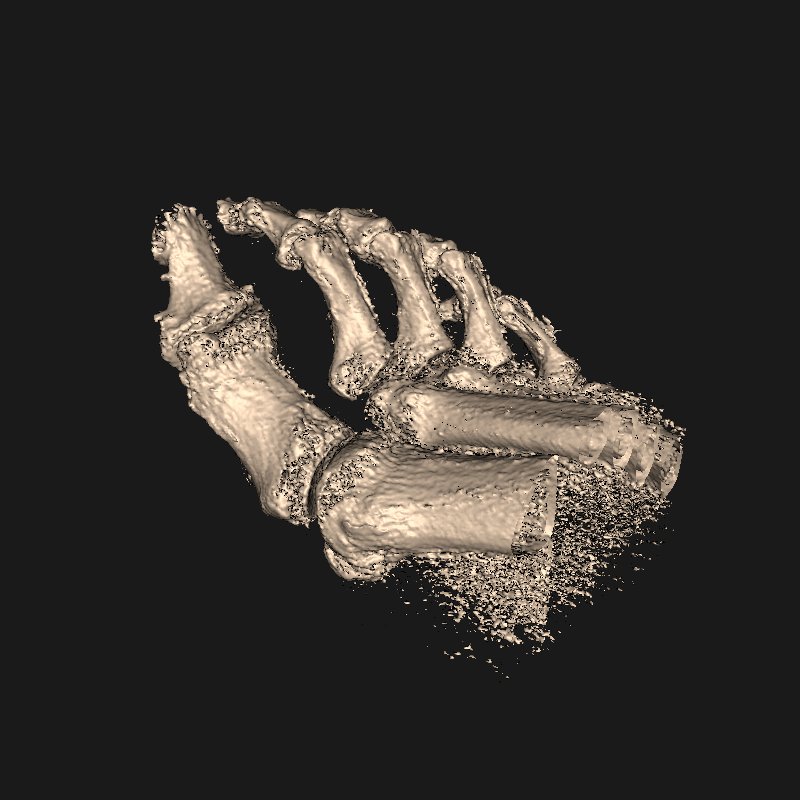

=== Iteration 8/10 ===
Rendered 7 candidate images: ['AZIMUTH_LEFT_COARSE', 'AZIMUTH_RIGHT_COARSE', 'ELEVATION_DOWN_COARSE', 'ELEVATION_UP_COARSE', 'STOP', 'ZOOM_IN', 'ZOOM_OUT']
Visual observation:
The current render shows a foot bone structure viewed from an oblique angle. Five elongated metatarsal bones are visible in the center-right portion of the frame, extending diagonally. To the left, there is a cluster of irregular tarsal bones forming a dense mass. Several toe bones (phalanges) are visible at the upper portion of the image, appearing segmented and articulated. The overall orientation shows the structure extending from lower-left to upper-right, with the heel/ankle region (tarsals) prominent on the left side and the toe structures visible at the top. Significant particle artifacts or rendering fragments are scattered throughout, particularly around the edges of the bone structures. The view appears to be from a lateral-oblique perspective, showing depth with some bones in for

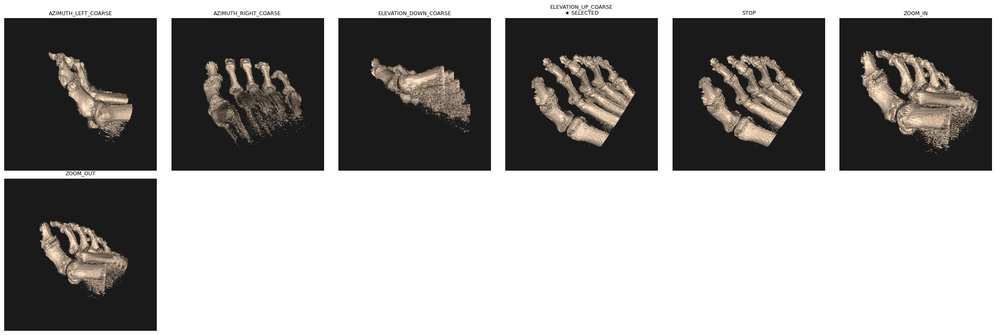

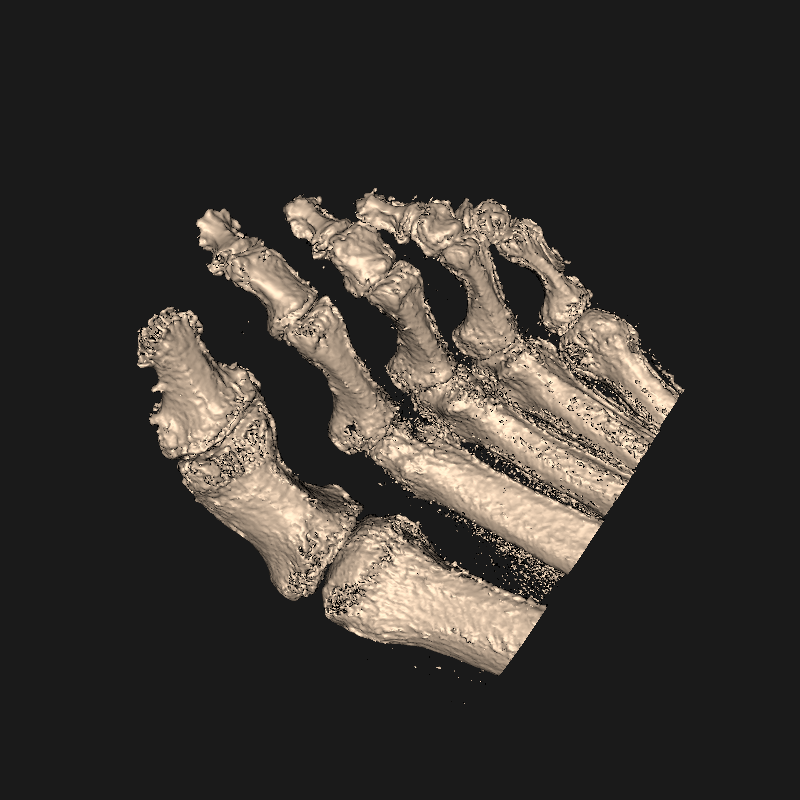

=== Iteration 9/10 ===
Rendered 7 candidate images: ['AZIMUTH_LEFT_COARSE', 'AZIMUTH_RIGHT_COARSE', 'ELEVATION_DOWN_COARSE', 'ELEVATION_UP_COARSE', 'STOP', 'ZOOM_IN', 'ZOOM_OUT']
Visual observation:
The current render shows a foot bone structure viewed from an oblique angle. Five distinct digit rays are visible, with elongated metatarsal bones forming parallel structures in the center and lower portions of the frame. The toe phalanges are visible at the upper portion of the image, appearing as segmented bone elements. On the left side of the frame, a large robust bone structure (likely the big toe's first metatarsal and associated tarsal bones) is prominent. The view appears to be from a perspective that shows the dorsal (top) surface of the foot, but with significant three-dimensional tilt. The metatarsals run roughly vertically through the frame, and the tarsal cluster occupies the lower left area.

Reference-view grounding:

reference_label: view_000
  diagnostic_visual_features: Fi

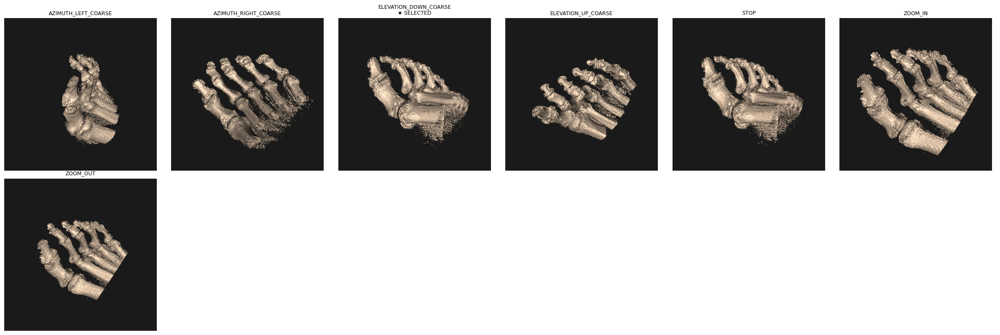

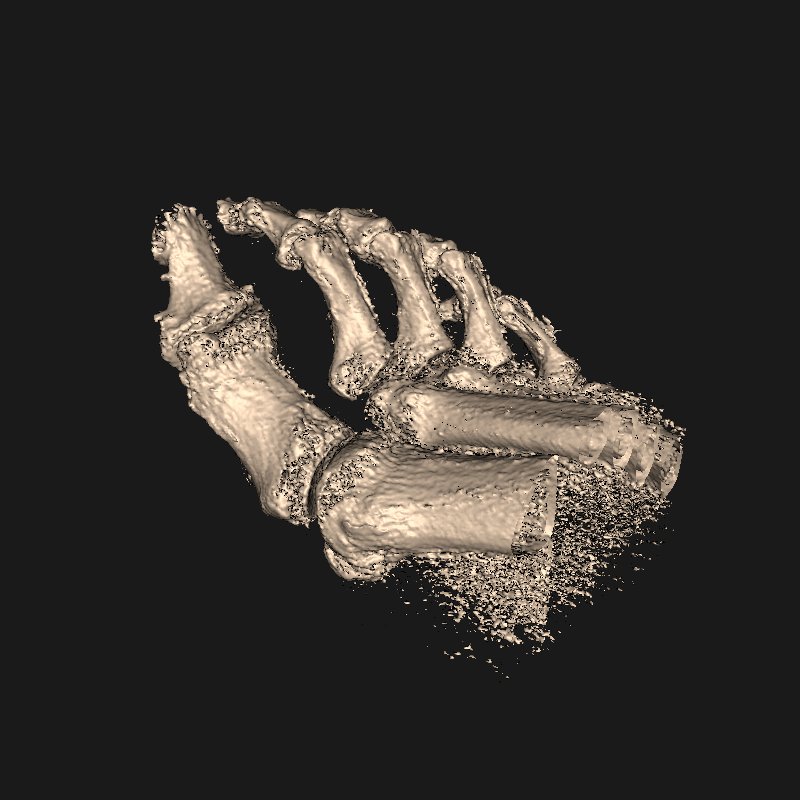

=== Iteration 10/10 ===
Rendered 7 candidate images: ['AZIMUTH_LEFT_COARSE', 'AZIMUTH_RIGHT_COARSE', 'ELEVATION_DOWN_COARSE', 'ELEVATION_UP_COARSE', 'STOP', 'ZOOM_IN', 'ZOOM_OUT']
Visual observation:
The current screenshot shows a foot skeleton rendered in beige tones against a black background. The view is oblique, showing the foot from what appears to be a three-quarter angle. In the upper-left portion of the frame, there is a cluster of small, irregularly shaped tarsal bones with complex surface textures. Moving toward the center and right, five elongated metatarsal shaft bones are visible, arranged in a fan-like pattern extending diagonally across the frame. At the top-right and right edges, smaller segmented phalangeal bones (toe bones) are visible, with multiple articulated segments forming the digits. The overall orientation shows the ankle/heel region in the upper-left, the midfoot bones in the center, and toe bones toward the right side of the frame. There is visible fragmenta

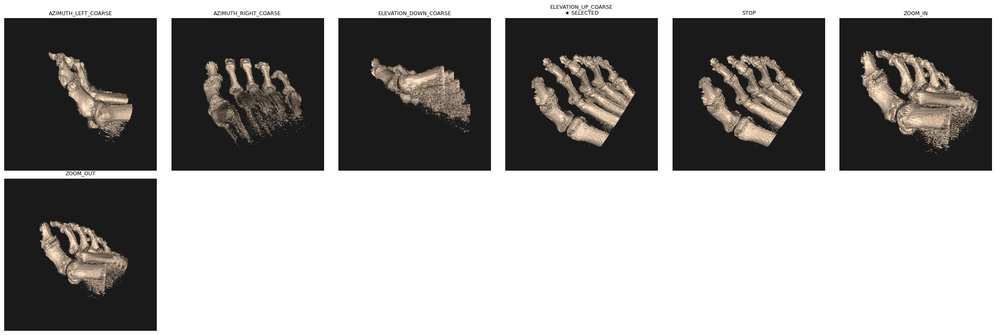

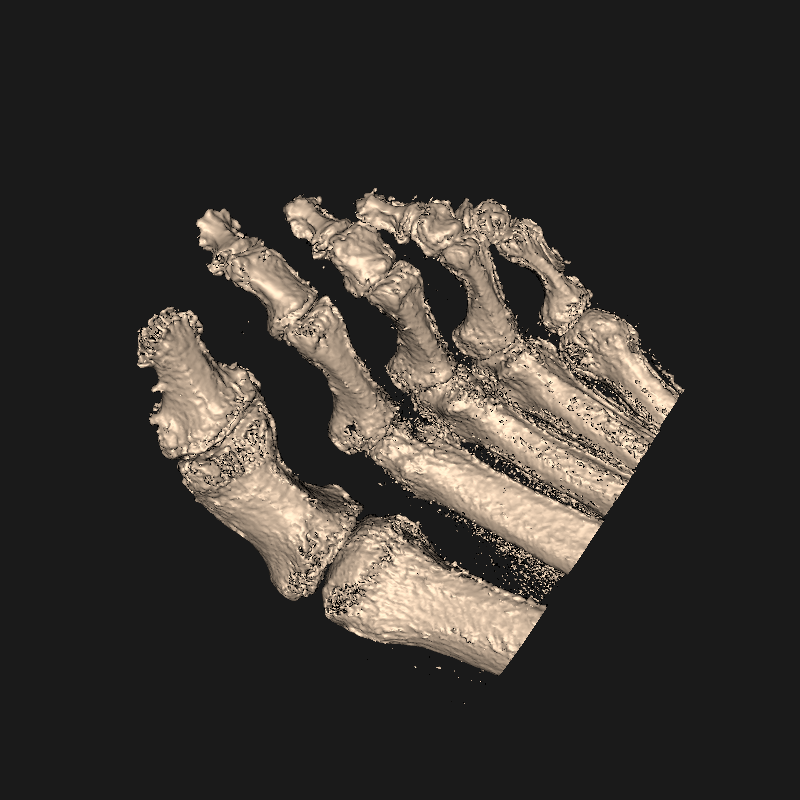


Applied actions: ['ELEVATION_DOWN_COARSE', 'AZIMUTH_LEFT_COARSE', 'ELEVATION_DOWN_MEDIUM', 'AZIMUTH_LEFT_COARSE', 'ELEVATION_UP_COARSE', 'ELEVATION_DOWN_COARSE', 'ELEVATION_DOWN_COARSE', 'ELEVATION_UP_COARSE', 'ELEVATION_DOWN_COARSE', 'ELEVATION_UP_COARSE']


In [9]:
import json
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from camera_reasoning import ACTION_DESCRIPTIONS
from camera_reasoning.visual_rollout_agent import render_candidate_rollouts

def display_candidate_images(rollouts, selected_action=None):
    """Show every candidate rollout image for one iteration, labeled by action
    name, with the one the LLM selected (if known yet) marked."""
    n = len(rollouts)
    cols = min(n, 6)
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
    axes = axes.flatten() if n > 1 else [axes]

    for i, r in enumerate(rollouts):
        img = mpimg.imread(r["image_path"])
        axes[i].imshow(img)
        axes[i].axis("off")
        marker = "\n★ SELECTED" if r["action"] == selected_action else ""
        axes[i].set_title(f"{r['action']}{marker}", fontsize=9)
    for j in range(n, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()

# reference_items: the graph-bank (reference_views_relative/) images+descriptions —
# built once here, reused every iteration, since the bank itself doesn't change.
_nodes = json.loads(open("../reference_views_relative/camera_nodes.json").read())
_descriptions = {d["node_id"]: d["description"] for d in json.loads(open("../reference_views_relative/view_descriptions.json").read())}
reference_items = [
    (n["node_id"], "../" + n["image_path"], _descriptions[n["node_id"]])
    for n in _nodes
    if n["node_id"] in _descriptions
]
print(f"Loaded {len(reference_items)} graph-bank reference items: {[label for label, _, _ in reference_items]}")

# Start small/cheap. Set to None to render every action in VALID_ACTIONS instead.
ACTION_SUBSET = {
    "AZIMUTH_LEFT_COARSE", "AZIMUTH_RIGHT_COARSE",
    "ELEVATION_UP_COARSE", "ELEVATION_DOWN_COARSE",
    "ZOOM_IN", "ZOOM_OUT", "STOP",
}

num_iterations = 10
applied_actions = []

for i in range(num_iterations):
    print(f"=== Iteration {i + 1}/{num_iterations} ===", flush=True)

    # candidate_reference_items: rendered fresh every iteration, one per candidate
    # action from the CURRENT camera state (never accumulates, restores the camera
    # afterward — see render_candidate_rollouts()).
    current_image_path = session.render_and_save()
    rollouts = render_candidate_rollouts(session, current_image_path, action_subset=ACTION_SUBSET)
    print(f"Rendered {len(rollouts)} candidate images: {[r['action'] for r in rollouts]}", flush=True)

    candidate_reference_items = [
        (r["action"], r["image_path"], ACTION_DESCRIPTIONS.get(r["action"], ""))
        for r in rollouts
    ]

    # prompt=None -> session.write_llm_prompt() runs exactly as before (unchanged
    # reasoning/format); reference_items + candidate_reference_items are both
    # attached — the graph bank first, then this iteration's rendered candidates.
    response = session.ask_chatgpt(reference_items=reference_items + candidate_reference_items)
    print(response, flush=True)

    # Same old parsing/application path as every other cell in this notebook.
    action = session.process_chatgpt_response(response)
    applied_actions.append(action)

    print(f"Candidates this iteration (★ = selected: {action}):", flush=True)
    display_candidate_images(rollouts, selected_action=action)

    display(Image("../output/screenshots/latest.png"))
    if action == "STOP":
        break

print("\nApplied actions:", applied_actions)

---
## Utilities

In [ ]:
# Manually apply an action without calling the OpenAI API
# session.process_chatgpt_response("Next action:\nAZIMUTH_RIGHT_MEDIUM")

# Or paste a ChatGPT reply you already have (e.g. from the web UI) and process it directly:
# chatgpt_response = """Next action:\nAZIMUTH_RIGHT_MEDIUM"""
# session.process_chatgpt_response(chatgpt_response)

In [ ]:
# Hard-reset the camera (destroys manual alignment)
# session.reset_camera()
# session.render_and_save()
# display(Image("../output/screenshots/latest.png"))

In [ ]:
# Restore camera from a saved state
# session.load_camera_state("../output/camera_states/step_003_ELEVATION_UP_MEDIUM.json")